# IMPORTAZIONI

In [1]:
# Installazione di Mediapipe e Keras

!pip install mediapipe
!pip install keras

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.7/35.7 MB 55.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.6/294.6 kB 20.2 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.20.3
    Uninstalling protobuf-3.20.3:
      Successfully uninstalled protobuf-3.20.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-metadata 1.15.0 requires protobuf<4.21,>=3.20.3; python_version < "3.11", but you have protobuf 4.25.4 which is incompatible.


In [2]:
# Montaggio di Google Drive

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Importazione delle librerie necessarie

import os
import numpy as np
import pandas as pd
import cv2
import keras
import mediapipe as mp
import matplotlib.pyplot as plt
from IPython.display import Image, display
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from keras.utils import to_categorical
from keras.models import Sequential
from keras.applications.vgg19 import VGG19
from tensorflow.keras import layers
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Activation
import itertools

# FUNZIONI

In [4]:
# Funzione per estrarre e disegnare punti di riferimento delle mani

def extract_hand_landmarks(image_path):
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    with mp_hands.Hands(static_image_mode=True, max_num_hands=1, min_detection_confidence=0.5) as hands:
        result = hands.process(image_rgb)

        if result.multi_hand_landmarks:
            annotated_image = image.copy()
            for hand_landmarks in result.multi_hand_landmarks:
                mp_drawing.draw_landmarks(
                    annotated_image, hand_landmarks, mp_hands.HAND_CONNECTIONS
                )
            return annotated_image
        else:
            return None

In [5]:
# Funzione per costruire il modello preaddestrato e personalizzarlo

def build_model():
    base = VGG19(include_top = False, weights='imagenet', input_shape = (128, 128, 3))
    X = base.output
    X = keras.layers.Flatten()(X)
    X = keras.layers.Dense(512, activation = 'relu')(X)
    X = keras.layers.Dropout(0.4)(X)
    X = keras.layers.BatchNormalization()(X)
    X = keras.layers.Dense(512, activation = 'relu')(X)
    X = keras.layers.Dropout(0.3)(X)
    X = keras.layers.BatchNormalization()(X)
    preds = keras.layers.Dense(26, activation = 'softmax')(X)

    model = keras.models.Model(inputs = base.input, outputs = preds)
    model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

    return model

In [6]:
# Funzione per visualizzare la matrice di confusione

def plot_confusion_matrix(y, y_pred):
    cm = confusion_matrix(y, y_pred)
    plt.figure(figsize=(15, 15))
    ax = plt.subplot()
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Purples)
    plt.colorbar()
    plt.title("Matrice di confusione")
    tick_marks = np.arange(len(labels))
    plt.xticks(tick_marks, labels, rotation=45)
    plt.yticks(tick_marks, labels)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    ax.title.set_fontsize(20)
    ax.xaxis.label.set_fontsize(16)
    ax.yaxis.label.set_fontsize(16)
    limit = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], 'd'), horizontalalignment="center",
                 color="white" if cm[i, j] > limit else "black")
    plt.show()

In [7]:
# Funzione per processare una nuova immagine

def preprocess_image(image_path):
    landmarked_image = extract_hand_landmarks(image_path)
    if landmarked_image is not None:
        image_resized = cv2.resize(landmarked_image, (128, 128))
        return np.expand_dims(image_resized.astype('float32') / 255, axis=0)
    else:
        return None

In [8]:
# Funzione per fare un test di classificazione su una nuova immagine

def testing(test_image_path):
  test_image = preprocess_image(test_image_path)
  if test_image is not None:
    plt.imshow(test_image[0])
    result = model.predict(test_image)
    predicted_label = labels[np.argmax(result)]
    print(f'Etichetta prevista: {predicted_label}')
  else:
    plt.imshow(cv2.imread(test_image_path))
    print("Nessuna mano rilevata nell'immagine.")

# PROCESSI PRELIMINARI E CARICAMENTO DATASET

In [9]:
# Inizializzazione di MediaPipe

mp_hands = mp.solutions.hands
mp_drawing = mp.solutions.drawing_utils

In [10]:
# Caricamento delle etichette

labels = sorted(os.listdir('/content/drive/MyDrive/Sign_Language/ASL'))
print(labels)

['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z', 'nothing']


In [11]:
# Eliminazione dell'etichetta 'nothing'

if "nothing" in labels:
    labels.remove("nothing")
print(labels)

['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']



 A


/usr/local/lib/python3.10/dist-packages/google/protobuf/symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '


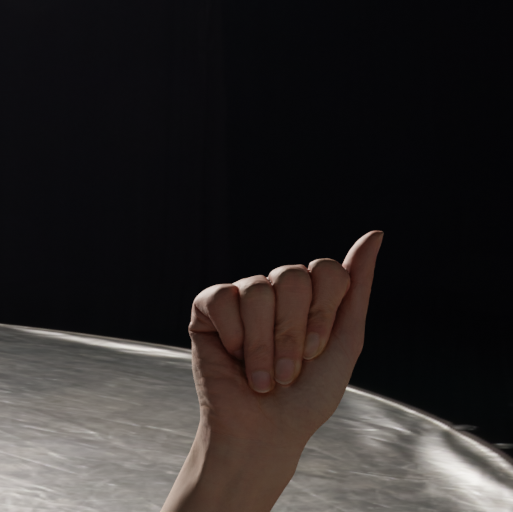

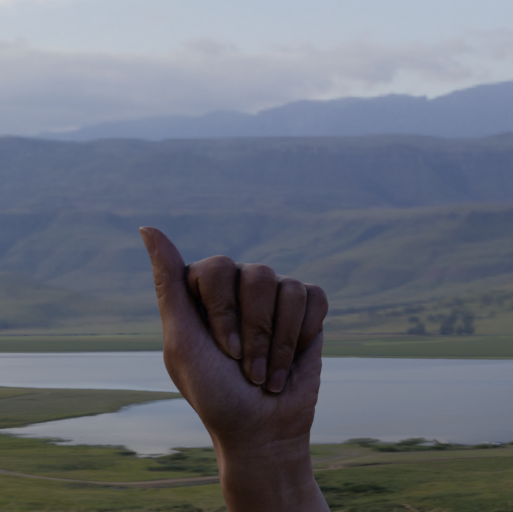

Ci sono 901 immagini nella classe A

 B


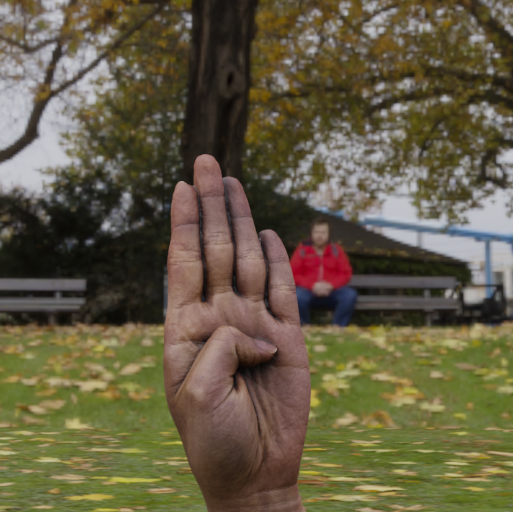

Ci sono 900 immagini nella classe B

 C


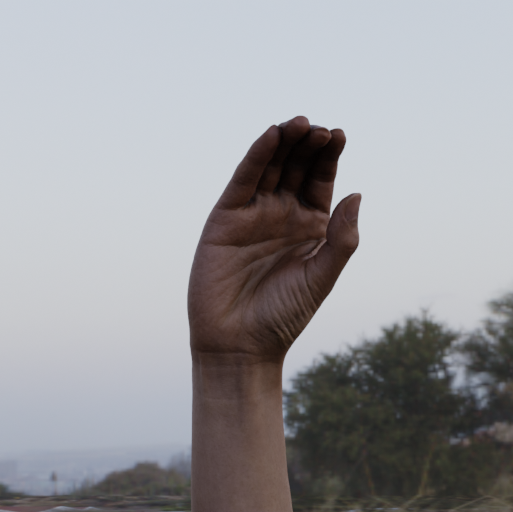

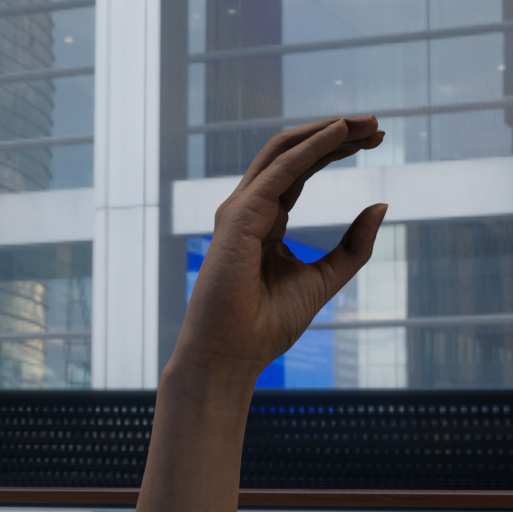

Ci sono 900 immagini nella classe C

 D


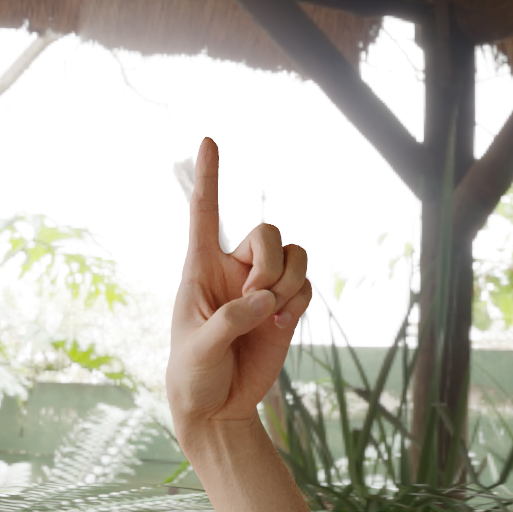

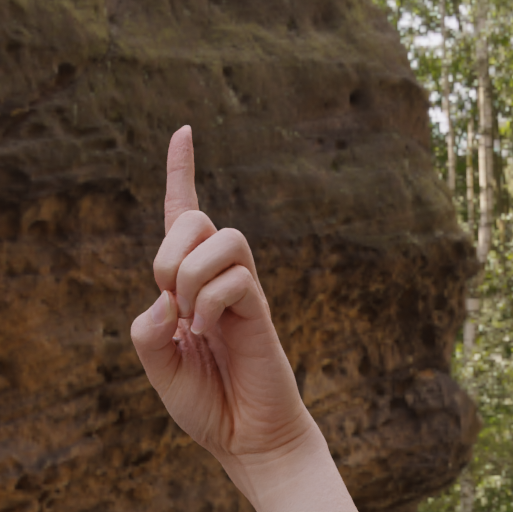

Ci sono 900 immagini nella classe D

 E


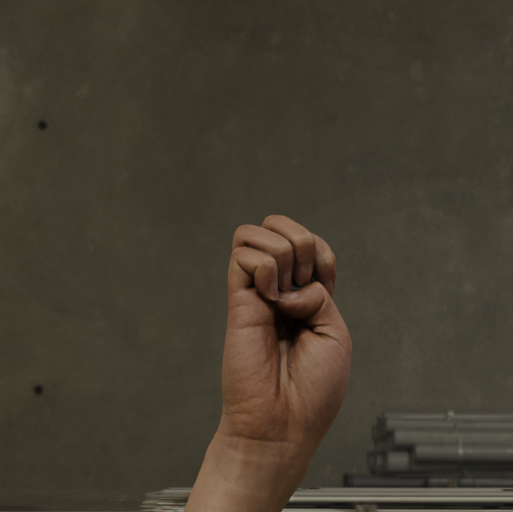

Ci sono 900 immagini nella classe E

 F


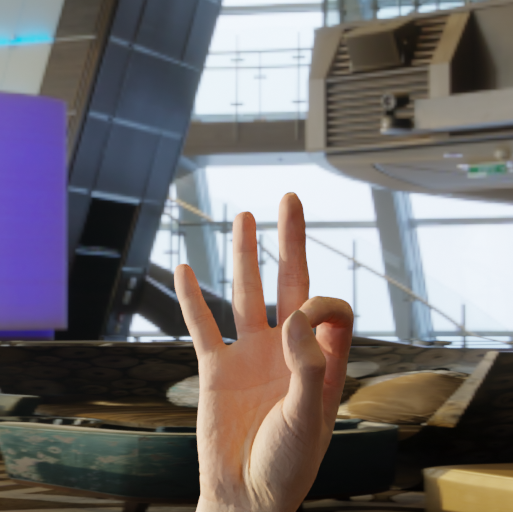

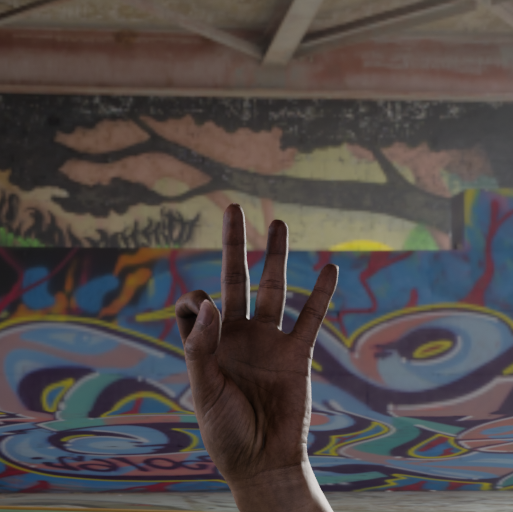

Ci sono 900 immagini nella classe F

 G


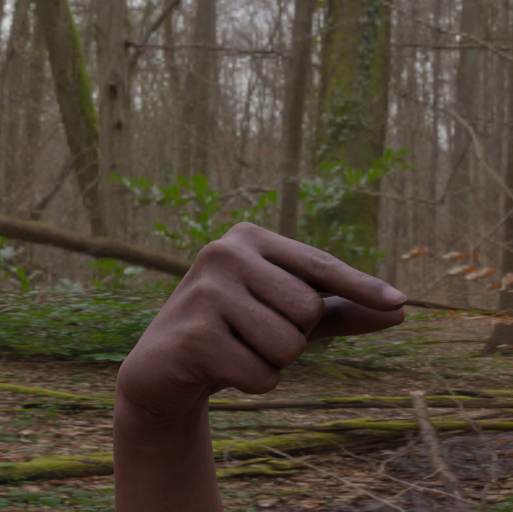

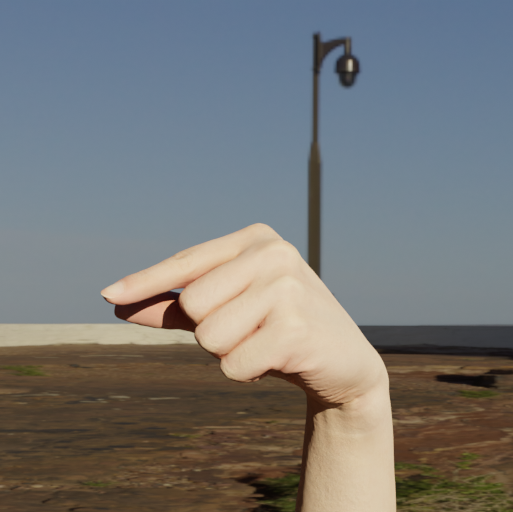

Ci sono 900 immagini nella classe G

 H


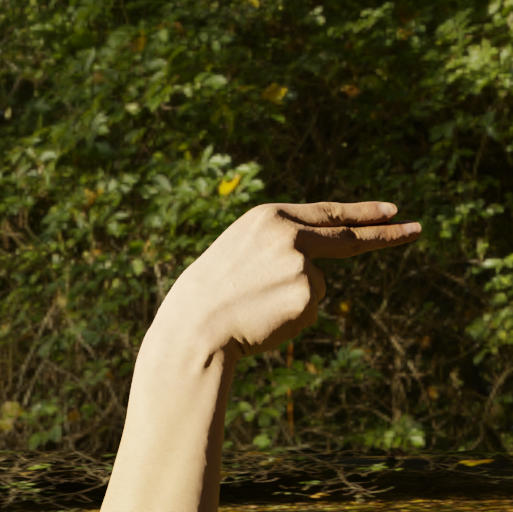

Ci sono 900 immagini nella classe H

 I


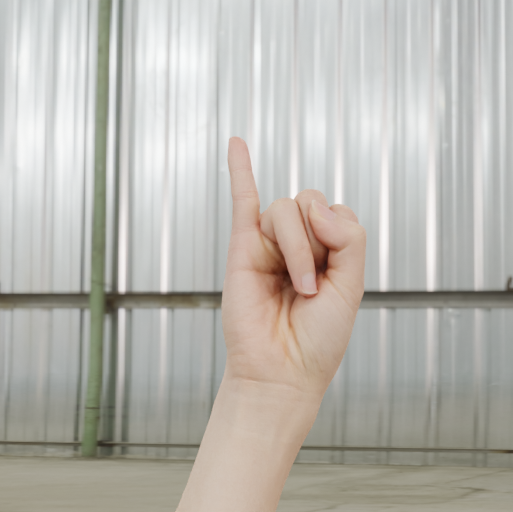

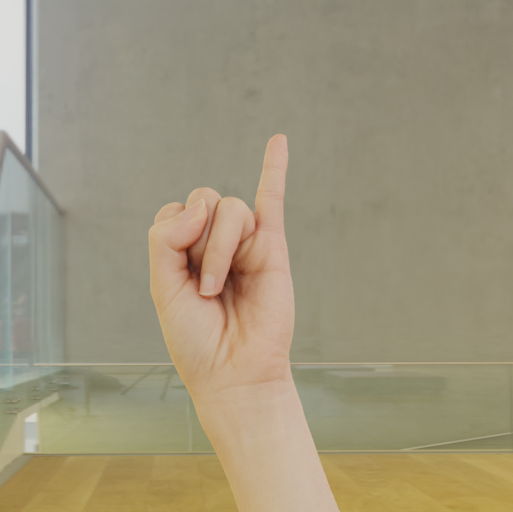

Ci sono 900 immagini nella classe I

 J


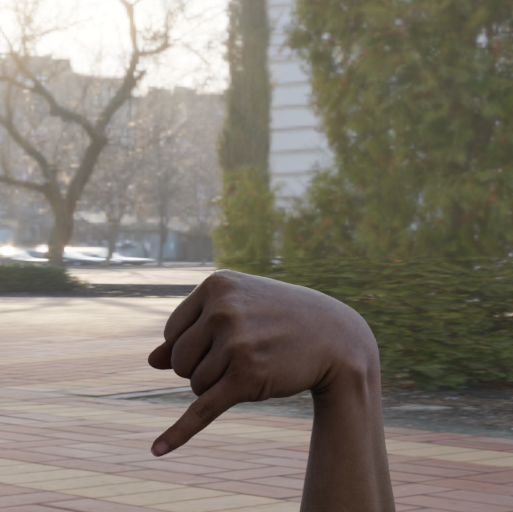

Ci sono 900 immagini nella classe J

 K
Ci sono 900 immagini nella classe K

 L


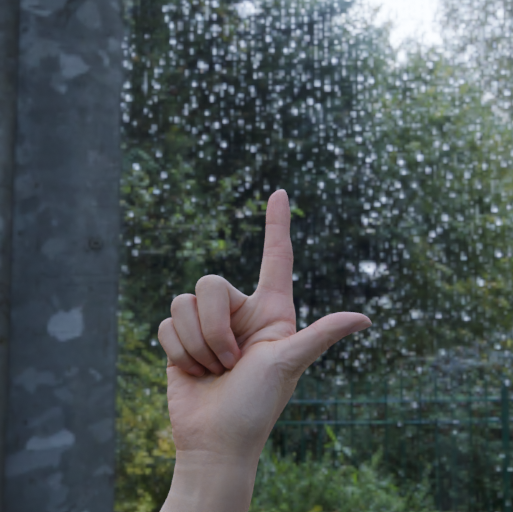

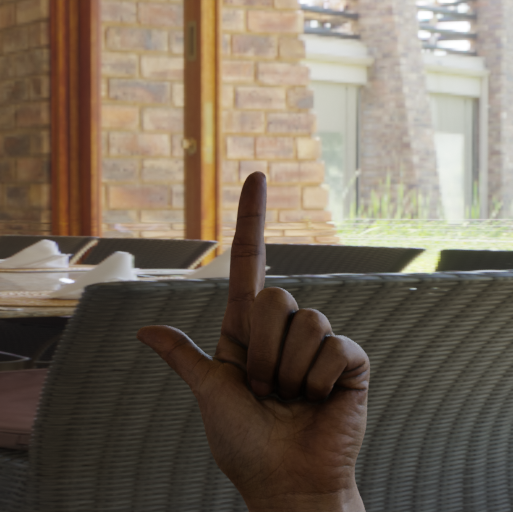

Ci sono 900 immagini nella classe L

 M
Ci sono 900 immagini nella classe M

 N


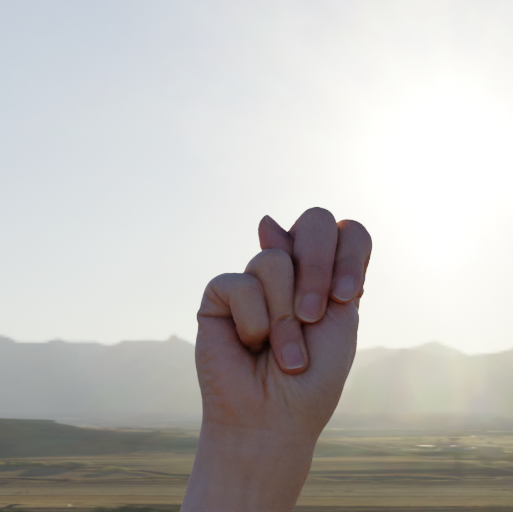

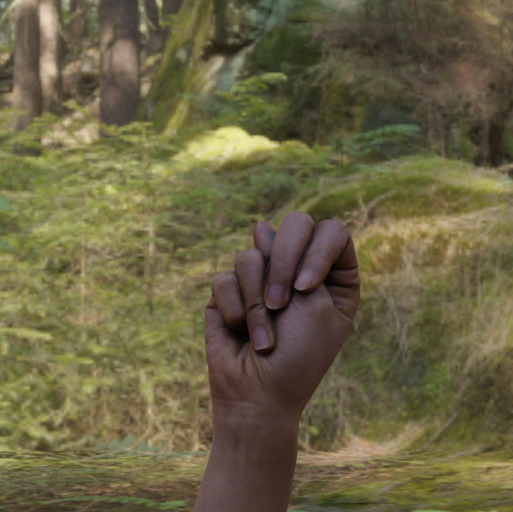

Ci sono 900 immagini nella classe N

 O


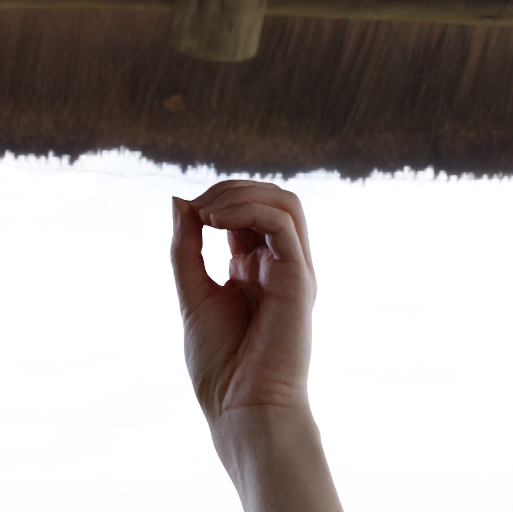

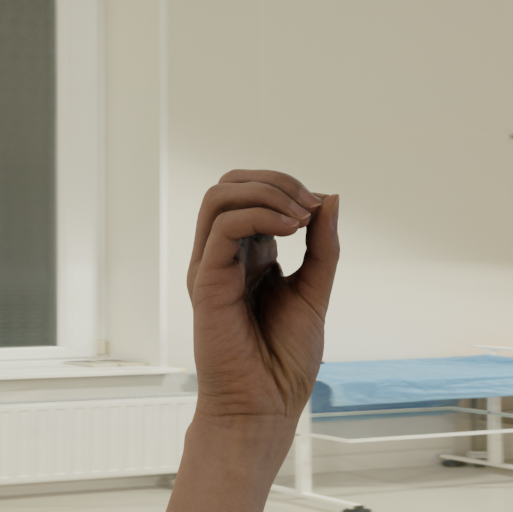

Ci sono 917 immagini nella classe O

 P


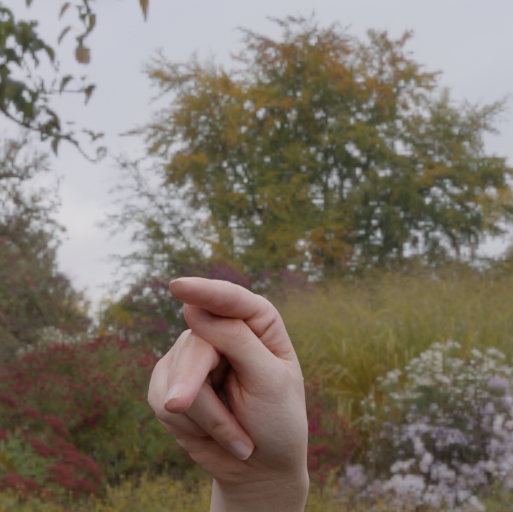

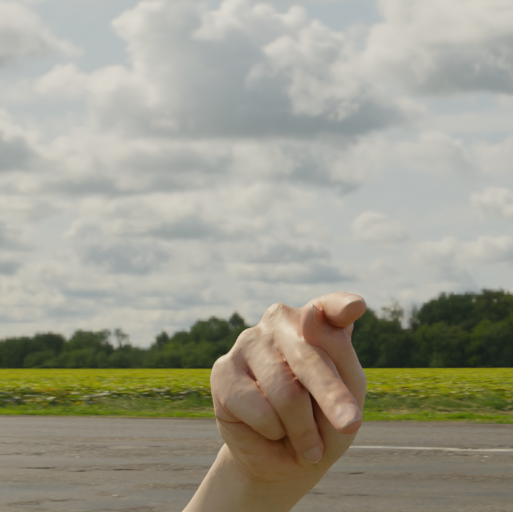

Ci sono 900 immagini nella classe P

 Q


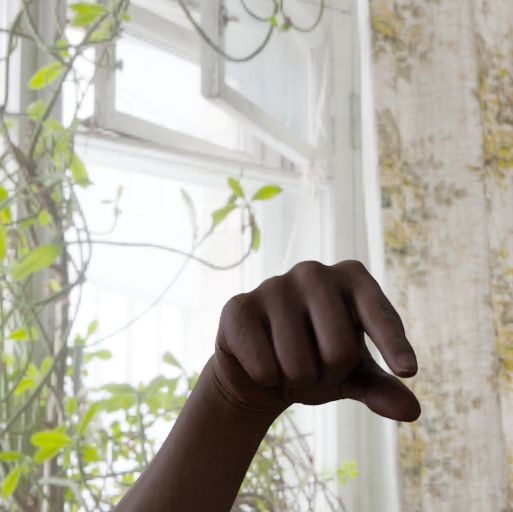

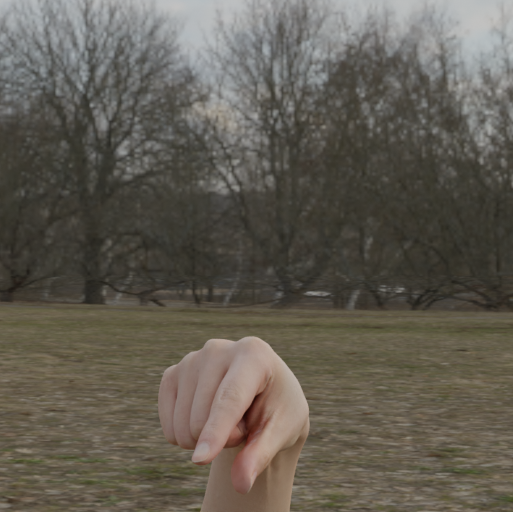

Ci sono 900 immagini nella classe Q

 R


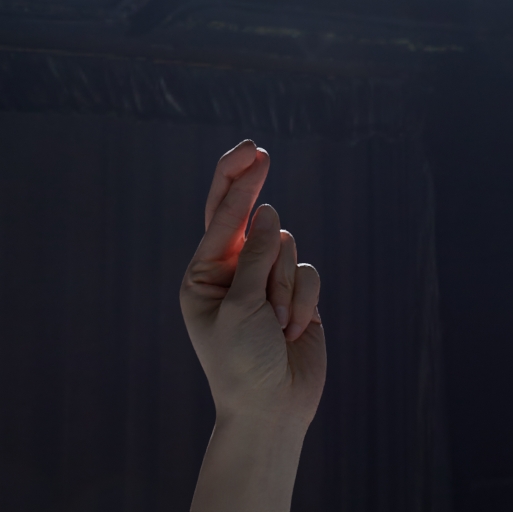

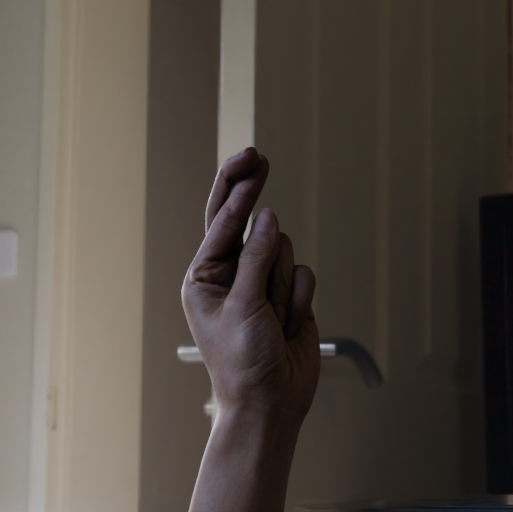

Ci sono 900 immagini nella classe R

 S


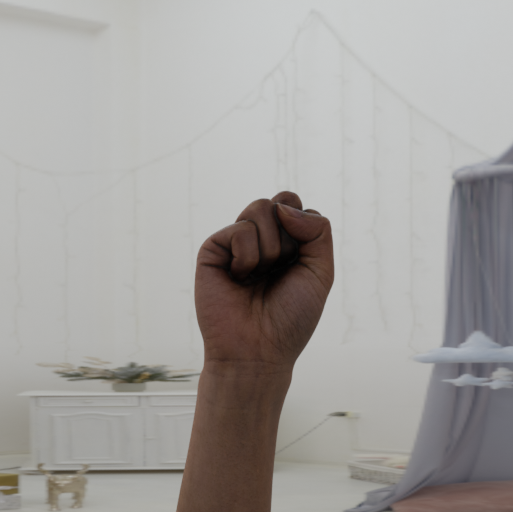

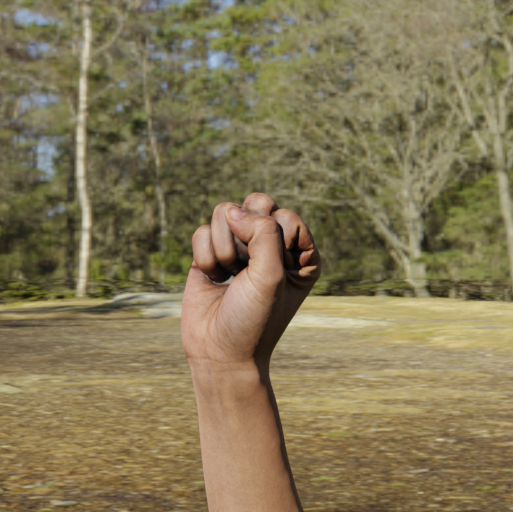

Ci sono 900 immagini nella classe S

 T


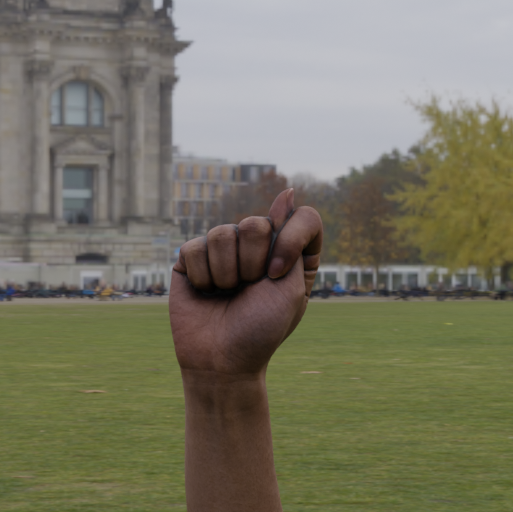

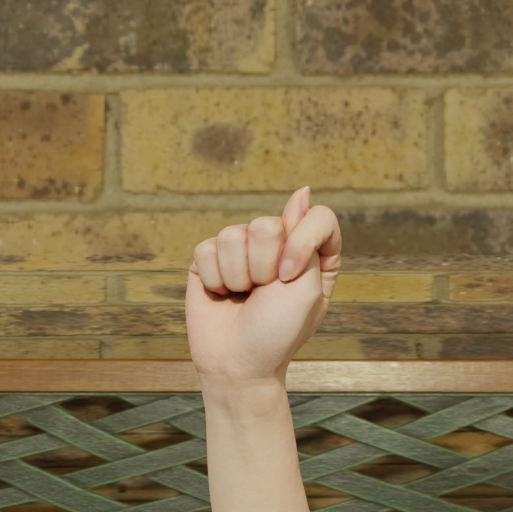

Ci sono 904 immagini nella classe T

 U


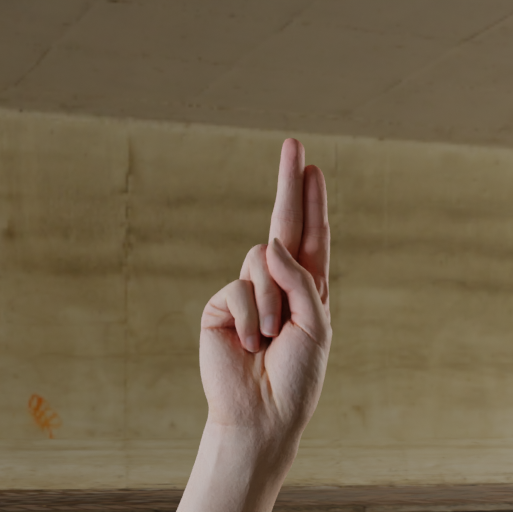

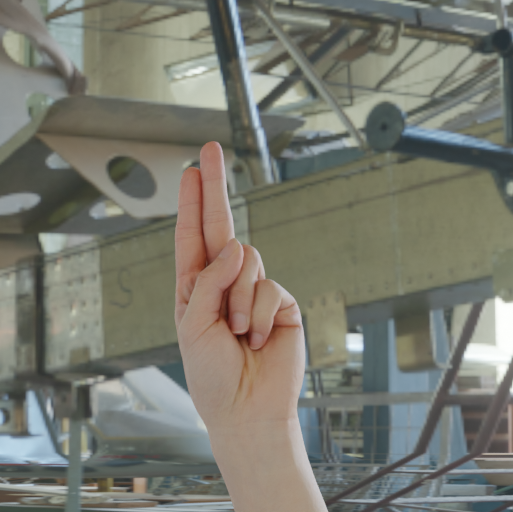

Ci sono 900 immagini nella classe U

 V


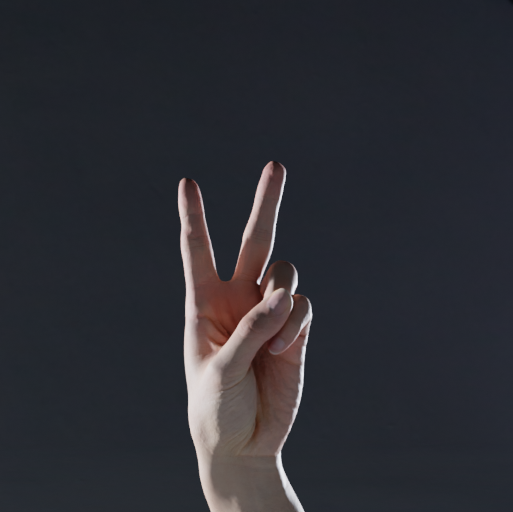

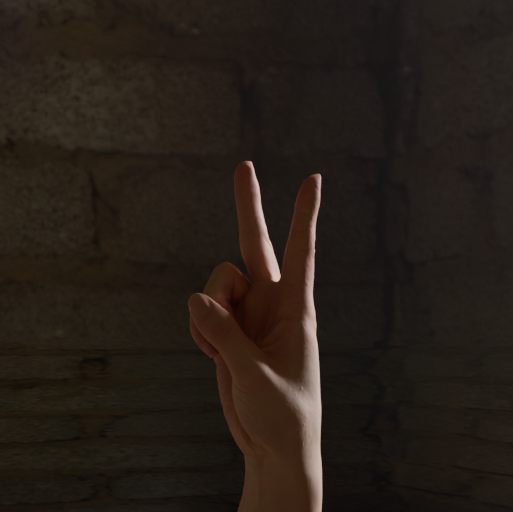

Ci sono 901 immagini nella classe V

 W


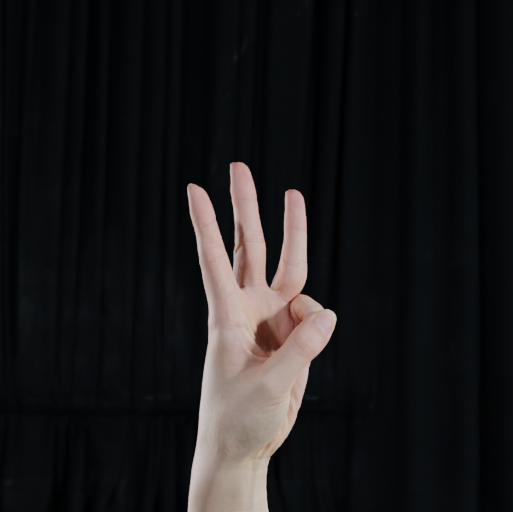

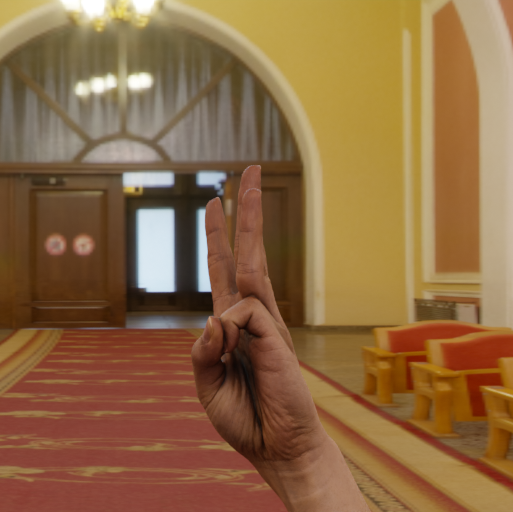

Ci sono 900 immagini nella classe W

 X


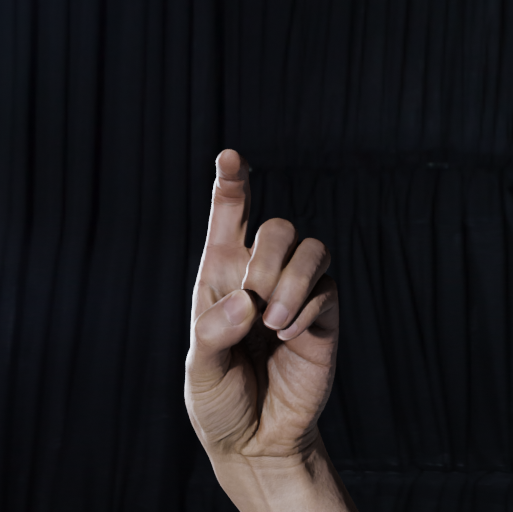

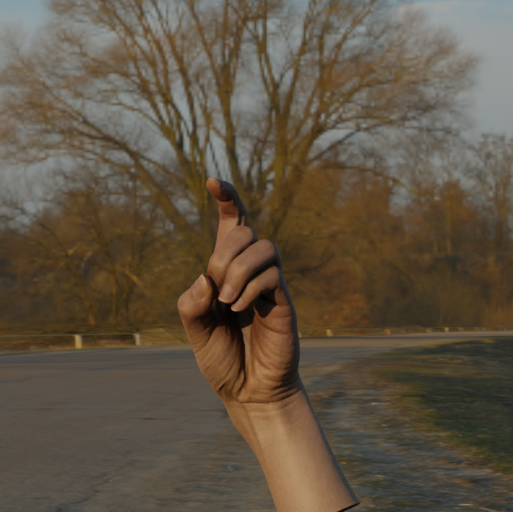

Ci sono 900 immagini nella classe X

 Y


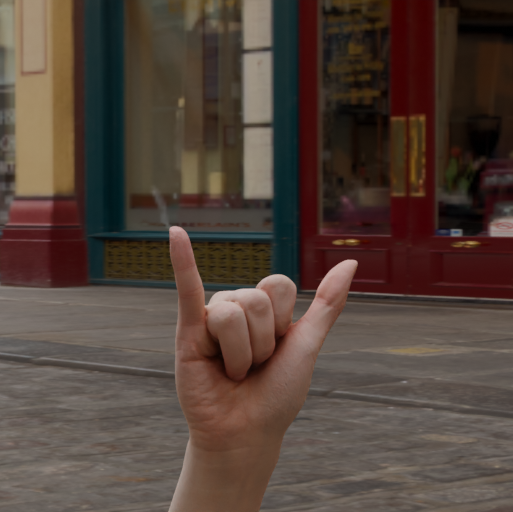

Ci sono 900 immagini nella classe Y

 Z


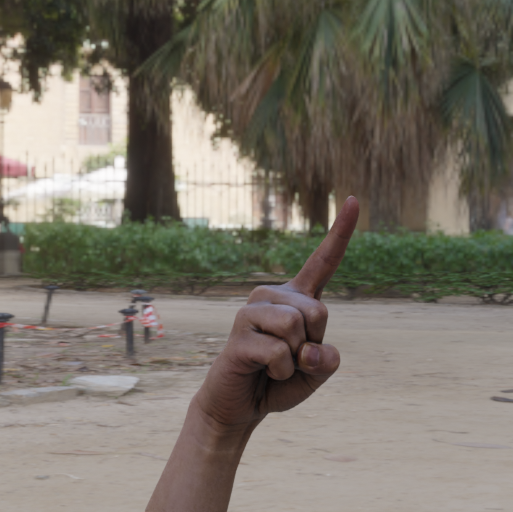

Ci sono 900 immagini nella classe Z


In [12]:
# Caricamento e visualizzazione delle immagini

num = []
for label in labels:
    path = f'/content/drive/MyDrive/Sign_Language/ASL/{label}/'
    folder_data = os.listdir(path)
    k = 0
    print('\n', label.upper())
    for image_path in folder_data:
        if k < 2:
            image_full_path = path + image_path
            landmarked_image = extract_hand_landmarks(image_full_path)
            if landmarked_image is not None:
                display(Image(image_full_path))
        k += 1
    num.append(k)
    print('Ci sono', k, 'immagini nella classe', label)

# ANALISI ED ELABORAZIONE DATI

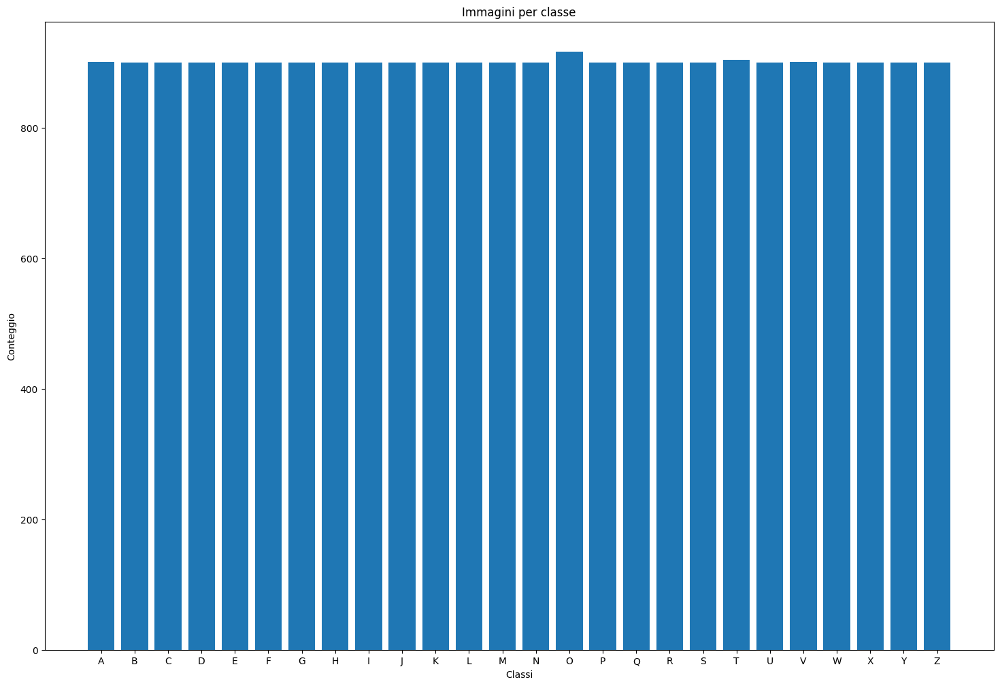

In [13]:
# Visualizzazione del numero di immagini per classe

plt.figure(figsize=(18, 12))
plt.bar(labels, num)
plt.title('Immagini per classe')
plt.xlabel('Classi')
plt.ylabel('Conteggio')
plt.show()

In [14]:
# Elaborazione delle immagini per estrarre i punti di riferimento delle mani

x_data = []
y_data = []

for label in labels:
    path = f'/content/drive/MyDrive/Sign_Language/ASL/{label}/'
    folder_data = os.listdir(path)

    for image_path in folder_data:
        image_full_path = path + image_path
        landmarked_image = extract_hand_landmarks(image_full_path)

        if landmarked_image is not None:
            image_resized = cv2.resize(landmarked_image, (128, 128))
            x_data.append(np.array(image_resized))
            y_data.append(label)

x_data = np.array(x_data)
y_data = np.array(y_data)
print('La forma di X è:', x_data.shape, 'e quella di Y è:', y_data.shape)

La forma di X è: (20924, 128, 128, 3) e quella di Y è: (20924,)


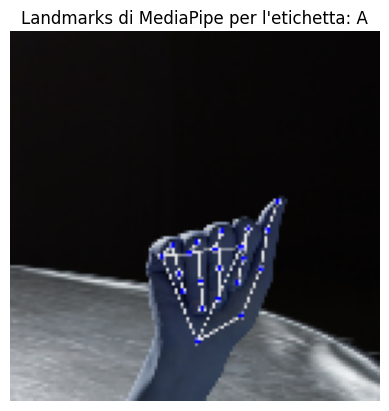

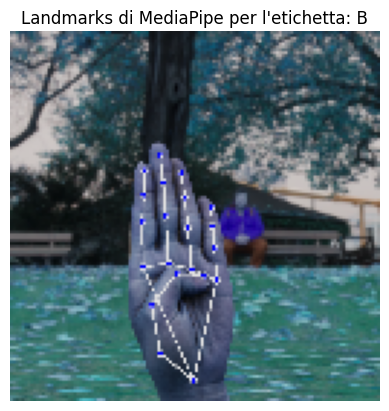

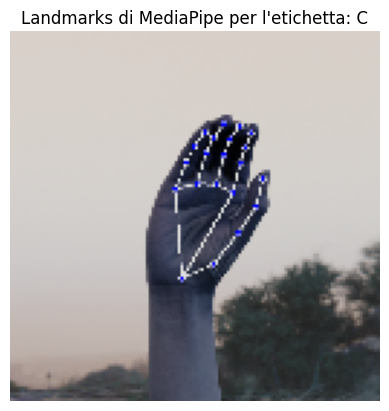

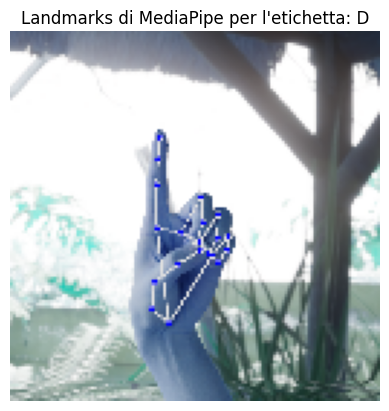

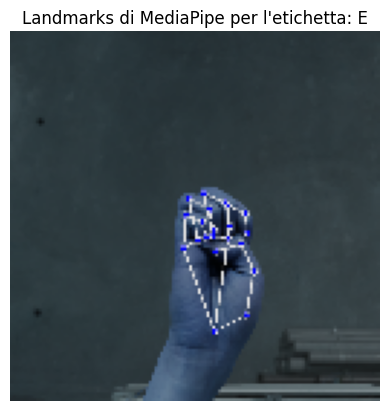

...

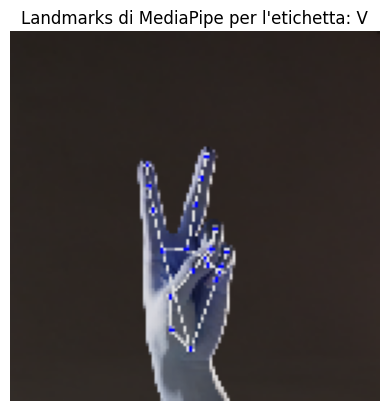

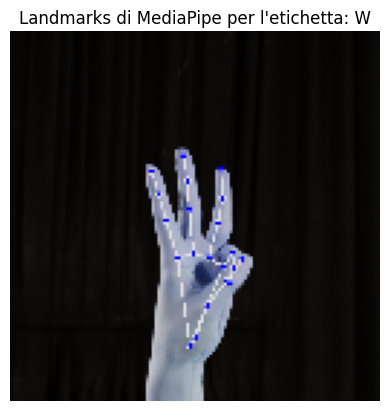

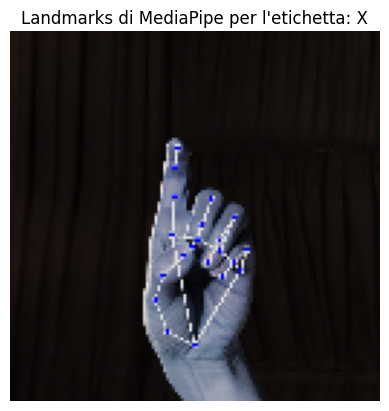

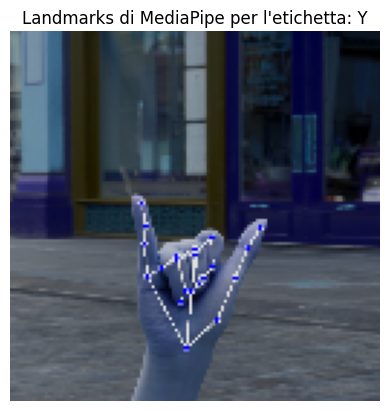

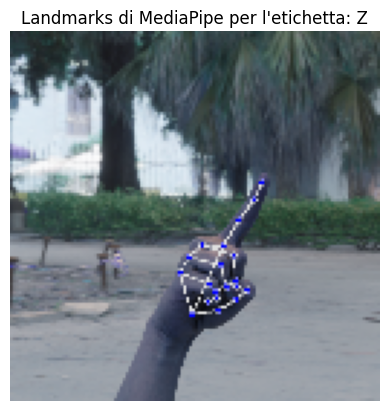

In [15]:
# Visualizzazione di un'immagine con i landmarks per ogni etichetta

unique_labels = np.unique(y_data)
for label in unique_labels:
    label_indices = np.where(y_data == label)[0]

    if len(label_indices) > 0:
        first_index = label_indices[0]
        plt.imshow(x_data[first_index])
        plt.title(f'Landmarks di MediaPipe per l\'etichetta: {label}')
        plt.axis('off')
        plt.show()
    else:
        print(f"Nessuna immagine con landmarks disponibile per l'etichetta: {label}")

In [16]:
# Standardizzazione dei dati di input

x_data = x_data.astype('float32') / 255

In [17]:
# Conversione di y_data in categoriale

y_encoded = LabelEncoder().fit_transform(y_data)
y_categorical = to_categorical(y_encoded)

In [18]:
# Miscelazione dei dati

r = np.arange(x_data.shape[0])
np.random.seed(42)
np.random.shuffle(r)
X = x_data[r]
Y = y_categorical[r]

In [19]:
# Divisione del dataset in training set e test set

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.33)

# COSTRUZIONE ED ADDESTRAMENTO MODELLO

In [20]:
# Costruzione del modello personalizzato

model = build_model()

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [21]:
# Riepilogo dei layer del modello

model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 128, 128, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 128, 128, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 64, 64, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 64, 64, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 32, 32, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 32, 32, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 32, 32, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv4 (Conv2D)                │ (None, 32, 32, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 16, 16, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv4 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 8, 8, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv4 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 24,499,290 (93.46 MB)

 Trainable params: 24,497,242 (93.45 MB)

 Non-trainable params: 2,048 (8.00 KB)

In [22]:
# Addestramento del modello

history_vgg = model.fit(X_train, Y_train, epochs=8, validation_split=0.2)

Epoch 1/8
351/351 ━━━━━━━━━━━━━━━━━━━━ 114s 259ms/step - accuracy: 0.1347 - loss: 3.3638 - val_accuracy: 0.5243 - val_loss: 4620.9717
Epoch 2/8
351/351 ━━━━━━━━━━━━━━━━━━━━ 69s 198ms/step - accuracy: 0.7280 - loss: 0.7663 - val_accuracy: 0.3937 - val_loss: 4.4281
Epoch 3/8
351/351 ━━━━━━━━━━━━━━━━━━━━ 70s 201ms/step - accuracy: 0.8337 - loss: 0.4757 - val_accuracy: 0.5745 - val_loss: 2.2011
Epoch 4/8
351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 202ms/step - accuracy: 0.8960 - loss: 0.3222 - val_accuracy: 0.9001 - val_loss: 45333.6484
Epoch 5/8
351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 202ms/step - accuracy: 0.9012 - loss: 0.2934 - val_accuracy: 0.9308 - val_loss: 1782.0240
Epoch 6/8
351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 203ms/step - accuracy: 0.9535 - loss: 0.1512 - val_accuracy: 0.7760 - val_loss: 30.7138
Epoch 7/8
351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 203ms/step - accuracy: 0.9385 - loss: 0.1963 - val_accuracy: 0.9711 - val_loss: 517.5610
Epoch 8/8
351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 203ms/step - accuracy: 0.9567 - l

In [23]:
# Salvataggio del modello

model.save('Pretrained_VGG-19_Model.h5')

# ANALISI DELLE PRESTAZIONI MODELLO

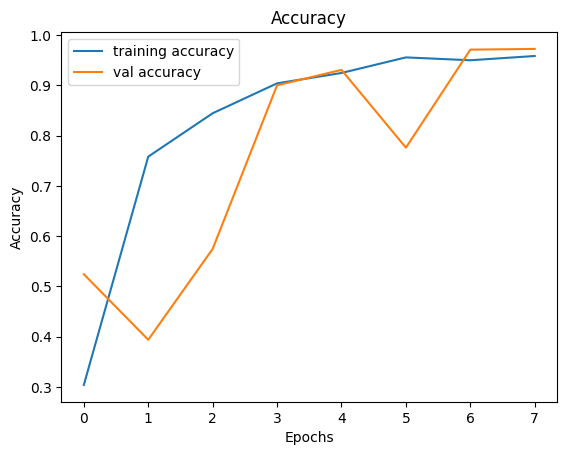

In [24]:
# Visualizzazione dell'accuratezza

plt.figure()
plt.plot(history_vgg.history['accuracy'], label='training accuracy')
plt.plot(history_vgg.history['val_accuracy'], label='val accuracy')
plt.title('Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

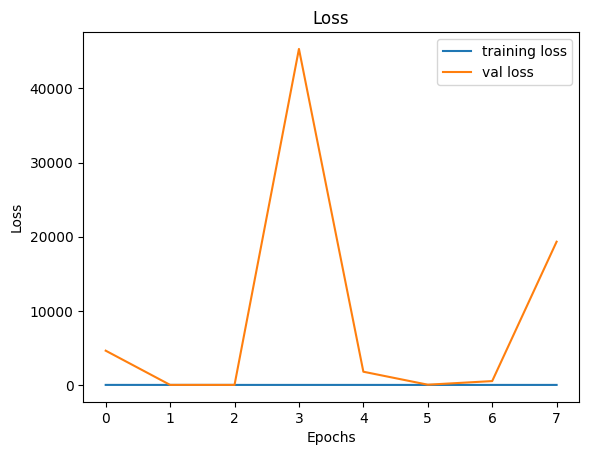

In [25]:
# Visualizzazione della perdita

plt.figure()
plt.plot(history_vgg.history['loss'], label='training loss')
plt.plot(history_vgg.history['val_loss'], label='val loss')
plt.title('Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [26]:
# Predizione e valutazione sul test set

Y_pred_vgg = model.predict(X_test)
Y_pred_vgg = np.argmax(Y_pred_vgg ,  axis=1)
Y_test = np.argmax(Y_test, axis=1)

print('L\'accuratezza ottenuta sul test set è:', accuracy_score(Y_pred_vgg,Y_test))
print(classification_report(Y_test, Y_pred_vgg))

216/216 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step
L'accuratezza ottenuta sul test set è: 0.9691527878349022
              precision    recall  f1-score   support

           0       0.99      0.95      0.97       299
           1       0.96      1.00      0.98       275
           2       0.94      1.00      0.97       253
           3       1.00      0.95      0.97       258
           4       0.98      0.93      0.95       237
           5       1.00      0.98      0.99       247
           6       0.99      1.00      0.99       294
           7       1.00      1.00      1.00       280
           8       0.96      0.97      0.96       277
           9       1.00      0.95      0.97       276
          10       0.98      1.00      0.99       283
          11       0.88      1.00      0.93       256
          12       0.98      0.92      0.95       267
          13       0.90      0.99      0.95       257
          14       0.99      0.99      0.99       273
          15       0.98      1.00 

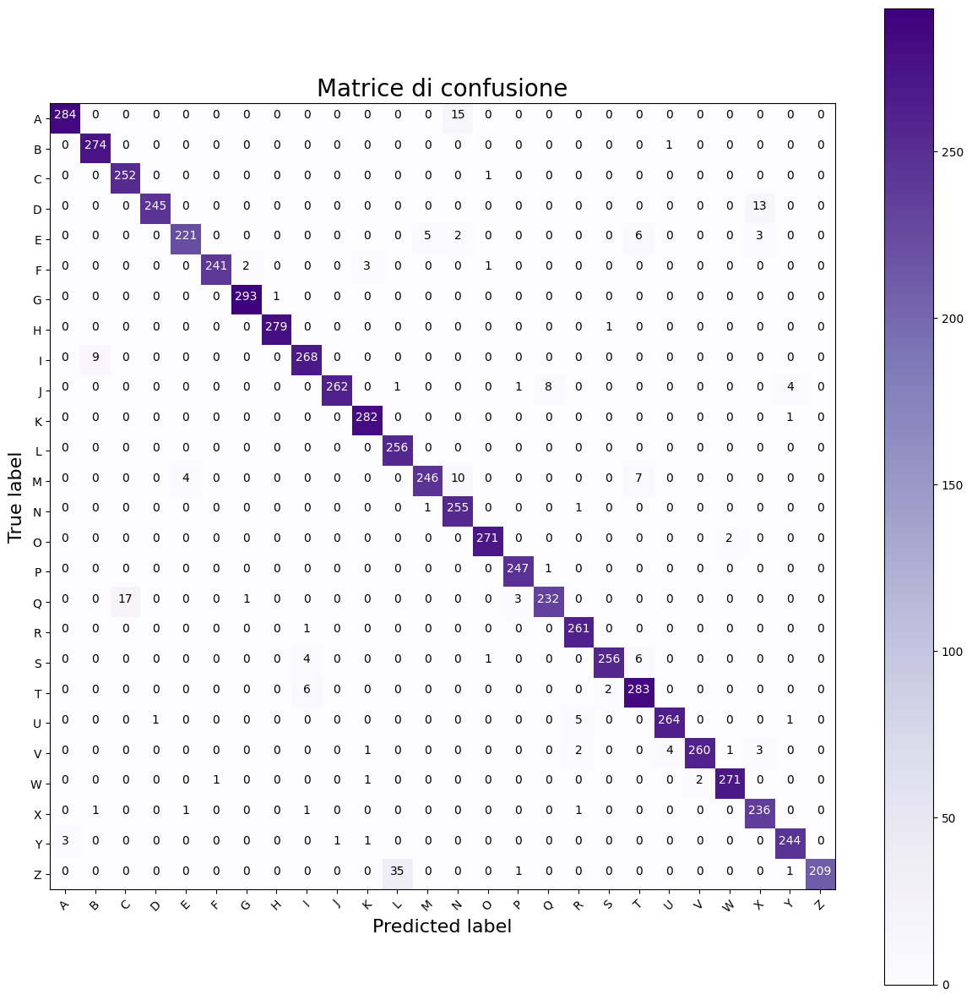

In [27]:
# Valutazione delle prestazioni attraverso matrice di confusione

plot_confusion_matrix(Y_test, Y_pred_vgg)

# TESTING

/usr/local/lib/python3.10/dist-packages/google/protobuf/symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Etichetta prevista: A


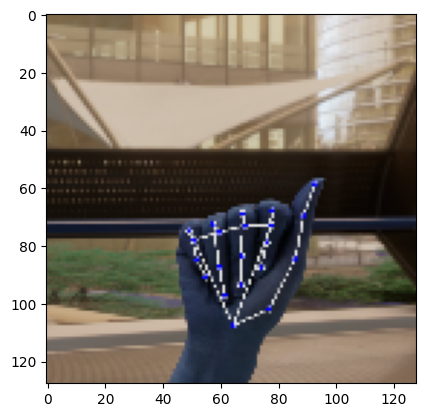

In [28]:
# Test con immagine della lettera A

esempio_A_path = '/content/drive/MyDrive/Sign_Language/Test/A_Sample.png'
testing(esempio_A_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Etichetta prevista: V


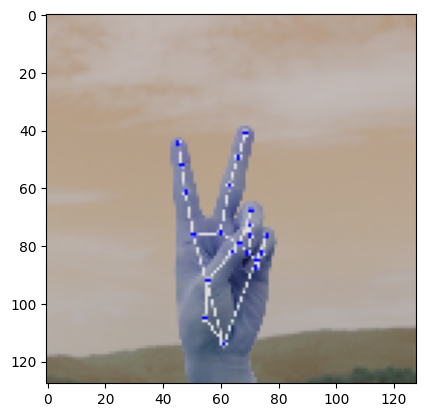

In [29]:
# Test con immagine della lettera V

esempio_V_path = '/content/drive/MyDrive/Sign_Language/Test/V_Sample.png'
testing(esempio_V_path)

Nessuna mano rilevata nell'immagine.


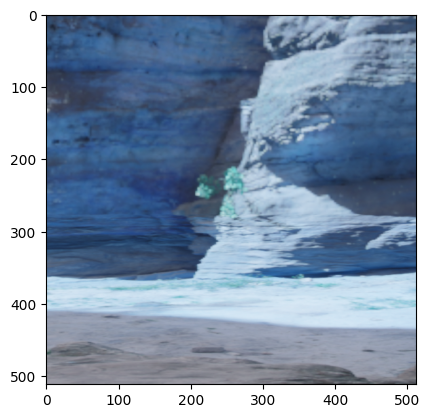

In [30]:
# Test con immagine vuota

esempio_nothing_path = '/content/drive/MyDrive/Sign_Language/Test/Nothing_Sample.png'
testing(esempio_nothing_path)